In [696]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn 
import plotly.express as px
import seaborn as sns 
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
from IPython.display import Image
from graphviz import Source
%matplotlib inline
pd.set_option('display.max_rows', None)
pd.options.display.max_seq_items = 1000

# Домашняя работа: деревья решений

В этой домашней работе вам предстоит научиться предсказывать цены товаров из маркетплейса Azamon.

Требования к домашней работе:
- Во всех графиках должны быть подписи через title, legend, etc.
- Во время обучения моделей проверяйте, что у вас не текут данные. Обычно это позитивно влияет на качество модели на тесте, но негативно влияет на оценку 🌚
- Если вы сдаете работу в Google Colaboratory, убедитесь, что ваша тетрадка доступна по ссылке.
- Использование мемов допускается, но необходимо соблюдать меру. Несодержательная работа, состоящая только из мемов, получает 0 баллов.

# Загрузка и подготовка данных

In [803]:
df = pd.read_csv(r'C:\Users\nikita\Desktop\ДЗ_деревья\2 дз\amazon_co-ecommerce_sample.csv').drop(columns=[
    'product_name',
    'index',
    'uniq_id',
    'customers_who_bought_this_item_also_bought',
    'items_customers_buy_after_viewing_this_item',
    'sellers',
    'description', # text
    'product_information', # text
    'product_description', # text
    'customer_questions_and_answers', # text
    'customer_reviews', # text
])

In [756]:
df

,manufacturer,price,number_available_in_stock,number_of_reviews,number_of_answered_questions,average_review_rating,amazon_category_and_sub_category
0,Hornby,£3.42,5 new,15,1.0,4.9 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...
1,FunkyBuys,£16.99,NaN,2,1.0,4.5 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...
2,ccf,£9.99,2 new,17,2.0,3.9 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...
3,Hornby,£39.99,NaN,1,2.0,5.0 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...
4,Hornby,£32.19,NaN,3,2.0,4.7 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...
5,Generic,£6.99,NaN,2,1.0,5.0 out of 5 stars,Hobbies > Model Trains & Railway Sets > Lighti...
6,Hornby,£24.99,NaN,2,1.0,4.5 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...
7,Hornby,£69.93,3 new,36,7.0,4.3 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...
8,Hornby,£235.58,4 new,1,1.0,5.0 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...
9,Chuggington,NaN,1 new,8,1.0,4.8 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...


## Очистка данных (1 балл)

Посмотрите на признаки. Есть ли в них пропуски? Какое соотношение между NaN'ами и общим количеством данных? Есть ли смысл выкидывать какие-либо данные из этого датасета?

In [804]:
df.isnull().sum()

manufacturer                           7
price                               1435
number_available_in_stock           2500
number_of_reviews                     18
number_of_answered_questions         765
average_review_rating                 18
amazon_category_and_sub_category     690
dtype: int64

In [805]:
df.dtypes

manufacturer                         object
price                                object
number_available_in_stock            object
number_of_reviews                    object
number_of_answered_questions        float64
average_review_rating                object
amazon_category_and_sub_category     object
dtype: object

In [806]:
#2500/10000 пропущенных значений, это сильно, дропнем столбец
df = df.drop(columns=['number_available_in_stock'])

## Подготовка данных (3 балла)

Обработайте признаки. Выполните кодирование категориальных признаков, заполните пропуски в числовых признаках. Обратите внимание, что в датасете есть признак, который разбивается на несколько подпризнаков. Что это за признак? Закодируйте и его.

Дополнительные вопросы (+ 1 балл):
- Какие из признаков в этом датасете лучше кодировать через ordinal encoding?
- Какие из признаков допустимо кодировать через one-hot?

Прим.: суммарно за эту секцию можно получить до 4 баллов.

In [807]:
#функции для превращения  в число
def rating_to_number(a):
    if isinstance(a, str):
        a = float(a.split(' ')[0])
    return a

def price_to_number(a): 
    if isinstance(a, str) and '£' in a:
        a =float(a.split('£')[1])
        return a
    
def to_num(a):
    a = float(a)
    return a

def number_of_reviews_to_number(a):
    if isinstance(a, str):
        a = a.replace(',', '.')
        a = float(a)
        return a

In [808]:
df_pre = df
df_pre = df_pre.dropna(subset=['price'])
df_pre = df_pre.drop(7094)
df_pre['price'] = df_pre[~df_pre['price'].str.contains('-')]['price']

In [809]:
df_pre['price'].apply(price_to_number)

0         3.42
1        16.99
2         9.99
3        39.99
4        32.19
5         6.99
6        24.99
7        69.93
8       235.58
10       27.49
11      273.60
12        9.60
13      119.50
18       17.08
19       96.05
20       27.55
21       24.50
22      149.92
23       12.87
24       49.95
26       14.44
29        5.95
30      139.95
31       19.99
32       25.50
34       99.95
35       49.33
36       82.31
37       14.99
39       69.99
40        3.40
41       50.81
42        4.99
43       36.51
44       14.99
45       11.58
47       79.95
48      135.00
49       42.98
50       50.01
51       34.95
52       28.99
54       59.99
55       96.00
56       35.20
57       39.03
58       15.25
59      167.10
60       98.50
61       19.95
62       35.00
63       51.61
64       30.99
67        6.50
68       45.75
69       74.60
70       74.99
71       76.99
72       27.60
73        8.00
74       11.01
75      100.00
76      177.99
77       10.20
78       22.25
79       15.75
80       8

In [810]:
#Найдем средние и медианы
mean_rating = df.dropna(subset= 'average_review_rating')['average_review_rating'].apply(rating_to_number).mean()
median_price = df_pre['price'].apply(price_to_number).median()
median_answered_questions = df['number_of_answered_questions'].median()
mean_rating, median_price, median_answered_questions

(4.707283109597286, 10.56, 1.0)

In [811]:
#Привели в порядок average_review_rating
df['average_review_rating'] = df['average_review_rating'].fillna(mean_rating)
df['average_review_rating'] = df['average_review_rating'].apply(rating_to_number)

In [812]:
#Привели в порядок price
df = df.drop(7094)
df['price'] = df['price'].fillna(median_price)
df['price'] = df['price'].astype(str)
df['price'] = df[~df['price'].str.contains('-')]['price']
df['price'] = df['price'].apply(price_to_number)
df = df.dropna(subset = 'price')
df['price'] = df['price'].apply(to_num)

In [813]:
#Привели в порядок number_of_answered_questions
df['number_of_answered_questions'] = df['number_of_answered_questions'].fillna(median_answered_questions)

In [814]:
#Привели в порядок number_of_reviews
median_number_of_reviews = df['number_of_reviews'].apply(number_of_reviews_to_number).median()
df['number_of_reviews'] = df['number_of_reviews'].fillna(median_number_of_reviews)
df['number_of_reviews'] =  df['number_of_reviews'].apply(number_of_reviews_to_number)
df['number_of_reviews'] = df['number_of_reviews'].fillna(median_number_of_reviews)

In [815]:
#Привели в порядок manufacturer и amazon_category_and_sub_category
df = df.dropna(subset = 'manufacturer', axis = 0) 
df = df.dropna(subset = 'amazon_category_and_sub_category', axis = 0) 

In [816]:
#кайф
df.isnull().sum()

manufacturer                        0
price                               0
number_of_reviews                   0
number_of_answered_questions        0
average_review_rating               0
amazon_category_and_sub_category    0
dtype: int64

In [772]:
df

,manufacturer,price,number_of_reviews,number_of_answered_questions,average_review_rating,amazon_category_and_sub_category
0,Hornby,3.42,15.000,1.0,4.900000,Hobbies > Model Trains & Railway Sets > Rail V...
1,FunkyBuys,16.99,2.000,1.0,4.500000,Hobbies > Model Trains & Railway Sets > Rail V...
2,ccf,9.99,17.000,2.0,3.900000,Hobbies > Model Trains & Railway Sets > Rail V...
3,Hornby,39.99,1.000,2.0,5.000000,Hobbies > Model Trains & Railway Sets > Rail V...
4,Hornby,32.19,3.000,2.0,4.700000,Hobbies > Model Trains & Railway Sets > Rail V...
5,Generic,6.99,2.000,1.0,5.000000,Hobbies > Model Trains & Railway Sets > Lighti...
6,Hornby,24.99,2.000,1.0,4.500000,Hobbies > Model Trains & Railway Sets > Rail V...
7,Hornby,69.93,36.000,7.0,4.300000,Hobbies > Model Trains & Railway Sets > Rail V...
8,Hornby,235.58,1.000,1.0,5.000000,Hobbies > Model Trains & Railway Sets > Rail V...
10,Hornby,27.49,1.000,1.0,5.000000,Hobbies > Model Trains & Railway Sets > Rail V...


In [817]:
#кодируем
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
df['manufacturer'] = encoder.fit_transform(df[['manufacturer']])
df['amazon_category_and_sub_category'] = encoder.fit_transform(df[['amazon_category_and_sub_category']])

In [774]:
df

,manufacturer,price,number_of_reviews,number_of_answered_questions,average_review_rating,amazon_category_and_sub_category
0,869.0,3.42,15.000,1.0,4.900000,152.0
1,670.0,16.99,2.000,1.0,4.500000,152.0
2,2100.0,9.99,17.000,2.0,3.900000,152.0
3,869.0,39.99,1.000,2.0,5.000000,152.0
4,869.0,32.19,3.000,2.0,4.700000,152.0
5,716.0,6.99,2.000,1.0,5.000000,148.0
6,869.0,24.99,2.000,1.0,4.500000,152.0
7,869.0,69.93,36.000,7.0,4.300000,152.0
8,869.0,235.58,1.000,1.0,5.000000,152.0
10,869.0,27.49,1.000,1.0,5.000000,151.0


In [818]:
#2442 или 255 значений этих категориальных переменных, one-hot сделала бы столько полей, bullshit


In [819]:
# можно юзать классификатор
df.dtypes

manufacturer                        float64
price                               float64
number_of_reviews                   float64
number_of_answered_questions        float64
average_review_rating               float64
amazon_category_and_sub_category    float64
dtype: object

# Обучение модели (3 балла)

## Бейзлайн

Обучите базовую модель. Для этого используйте `sklearn.dummy.DummyRegressor`. Какое качество она показывает на тесте? Посчитайте MSE, RMSE.

In [820]:
from sklearn.dummy import DummyRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score, precision_score, recall_score, f1_score

In [821]:
X = df.drop(columns= 'price')
y = df['price']

In [822]:
X

,manufacturer,number_of_reviews,number_of_answered_questions,average_review_rating,amazon_category_and_sub_category
0,869.0,15.000,1.0,4.900000,152.0
1,670.0,2.000,1.0,4.500000,152.0
2,2100.0,17.000,2.0,3.900000,152.0
3,869.0,1.000,2.0,5.000000,152.0
4,869.0,3.000,2.0,4.700000,152.0
5,716.0,2.000,1.0,5.000000,148.0
6,869.0,2.000,1.0,4.500000,152.0
7,869.0,36.000,7.0,4.300000,152.0
8,869.0,1.000,1.0,5.000000,152.0
10,869.0,1.000,1.0,5.000000,151.0


In [823]:
y

0         3.42
1        16.99
2         9.99
3        39.99
4        32.19
5         6.99
6        24.99
7        69.93
8       235.58
10       27.49
11      273.60
12        9.60
13      119.50
18       17.08
19       96.05
20       27.55
21       24.50
22      149.92
23       12.87
24       49.95
26       14.44
29        5.95
30      139.95
31       19.99
32       25.50
34       99.95
35       49.33
36       82.31
37       14.99
39       69.99
40        3.40
41       50.81
42        4.99
43       36.51
44       14.99
45       11.58
47       79.95
48      135.00
49       42.98
50       50.01
51       34.95
52       28.99
54       59.99
55       96.00
56       35.20
57       39.03
58       15.25
59      167.10
60       98.50
61       19.95
62       35.00
63       51.61
64       30.99
67        6.50
68       45.75
69       74.60
70       74.99
72       27.60
73        8.00
74       11.01
75      100.00
76      177.99
77       10.20
78       22.25
79       15.75
80       89.99
81        

In [824]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42)

In [825]:
Dummy_Regressor = DummyRegressor()

In [826]:
Dummy_Regressor.fit(X_train, y_train)

DummyRegressor()

In [827]:
Dummy_Regressor_pred = Dummy_Regressor.predict(X_test)

In [828]:
Dummy_Regressor_pred

array([19.82021849, 19.82021849, 19.82021849, ..., 19.82021849,
       19.82021849, 19.82021849])

In [829]:
MSE = mean_squared_error(y_test, Dummy_Regressor_pred)
RMSE = np.sqrt(MSE)
print(f"MSE = {MSE}, RMSE = {RMSE}")

MSE = 1708.7361230030567, RMSE = 41.33686155240933


## Дерево решений

Обучите регрессионное дерево решений, проверьте качество этой модели на тестовой выборке. Улучшилось ли качество по сравнению с базовой моделью? Оцените r2_score обученной модели.

In [830]:
Decision_Tree_Regressor = DecisionTreeRegressor()

In [831]:
Decision_Tree_Regressor.fit(X_train, y_train)

DecisionTreeRegressor()

In [832]:
Decision_Tree_Regressor_pred = Decision_Tree_Regressor.predict(X_test)

In [833]:
Decision_Tree_Regressor_pred

array([ 12.61      ,  19.7       ,   3.10333333, ..., 199.99      ,
        21.958     ,   4.26      ])

In [834]:
r2_score(y_test, Decision_Tree_Regressor_pred)

-0.5221220585215489

In [835]:
MSE = mean_squared_error(y_test, Decision_Tree_Regressor_pred)
RMSE = np.sqrt(MSE)
R2 = r2_score(y_test, Decision_Tree_Regressor_pred)
print(f"MSE = {MSE}, RMSE = {RMSE}, R2 = {R2}")

MSE = 2600.897375243188, RMSE = 50.99899386500863, R2 = -0.5221220585215489


In [836]:
# по сравнению с базовой моделью ухудшилось

## Линейная регрессия

Попробуйте обучить линейную регрессию с параметрами по умолчанию. Оцените r2_score на тестовой выборке. Сравните качество с деревом решений. 

In [837]:
from sklearn.linear_model import LinearRegression

In [838]:
Linear_Regression = LinearRegression()

In [839]:
Linear_Regression.fit(X_train, y_train)

LinearRegression()

In [840]:
Linear_Regression_pred = Linear_Regression.predict(X_test)

In [841]:
MSE = mean_squared_error(y_test, Linear_Regression_pred)
RMSE = np.sqrt(MSE)
R2 = r2_score(y_test, Linear_Regression_pred)
print(f"MSE = {MSE}, RMSE = {RMSE}, R2 = {R2}")

MSE = 1701.2087207626798, RMSE = 41.245711543900896, R2 = 0.004402347947318086


In [842]:
# у дерева решений солидно похуже

# Гиперпараметры (2 балла)

Переберите несколько гиперпараметров (не более двух-трёх). Обратите внимание, как эти параметры влияют на ошибку модели на тестовой выборке. Постройте для глубины дерева график переобучения (fitting curve) аналогичный тому, что мы строили на занятии. Найдите глубину дерева, начиная с которой модель начинает переобучаться.

In [843]:
def plot_fitting_curve(parameter: str, values: list, score, X_train, X_test, y_train, y_test):
    train_curve = []
    test_curve = []
    for value in values:
        # инициализация объекта из словаря
        # распаковка словаря через ** эквивалентна перечислению аргументов
        model = DecisionTreeRegressor(**{parameter: value})
        model.fit(X_train, y_train)
        y_pred_train, y_pred_test = model.predict(X_train), model.predict(X_test)
        train_curve.append(score(y_train, y_pred_train))
        test_curve.append(score(y_test, y_pred_test))
    sns.lineplot(x=values, y=train_curve, color = 'red')
    sns.lineplot(x=values, y=test_curve)

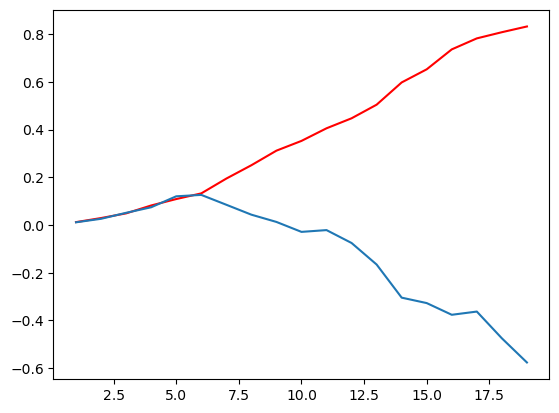

In [844]:
#Переобучение начинается после глубины 6
plot_fitting_curve('max_depth', np.arange(1, 20), r2_score, X_train, X_test, y_train, y_test)

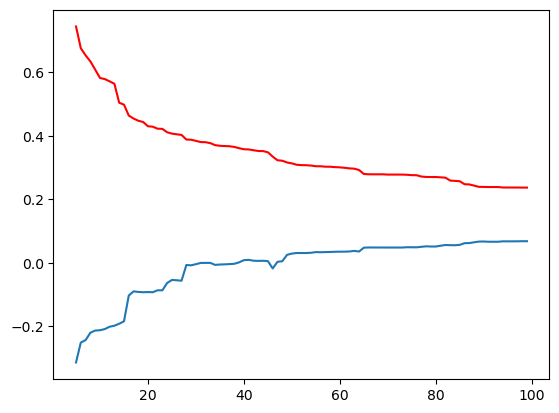

In [845]:
#оптимально ~ 28
plot_fitting_curve('min_samples_split', np.arange(5, 100),r2_score, X_train, X_test, y_train, y_test)

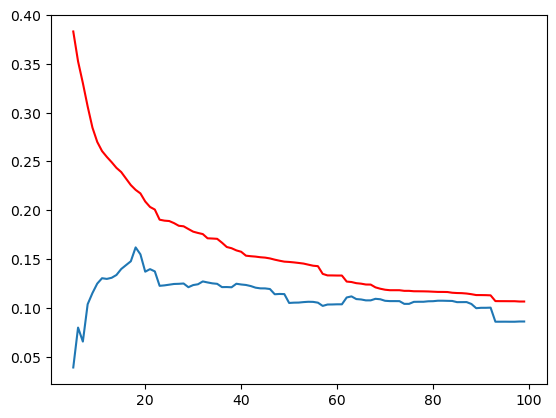

In [846]:
#оптимально ~ 19
plot_fitting_curve('min_samples_leaf', np.arange(5, 100),r2_score, X_train, X_test, y_train, y_test)

# Простое ансамблирование (1 балл)

В этой секции мы реализуем простой ансамбль деревьев.

In [683]:
class EnsembleTreeRegressor:
    def __init__(self, num_trees=5, samples_frac=0.8, **model_kwargs):
        self.num_trees= num_trees
        self._samples_frac = 0.8
        self._trees = [DecisionTreeRegressor(**model_kwargs) for _ in range(num_trees)]
    def fit(self, x, y: pd.Series):
        x = pd.DataFrame(x)
        y = y.reset_index(drop=True)
        for tree in self._trees:
            tree_x = x.sample(frac=self._samples_frac, random_state=42)
            tree_y = y[tree_x.index]
            tree.fit(tree_x, tree_y)
        return self

    def predict(self, x: pd.DataFrame):
        x = pd.DataFrame(x)
        res = []
        for i in range(self.num_trees):
          res.append(self._trees[i].predict(x))
        return sum(res) / len(res)

Проверьте, работает ли этот ансамбль лучше обычного дерева с параметрами по умолчанию?

Дополнительно переберите максимальную глубину дерева. Проверьте, насколько отличается момент начала переобучения у одиночного дерева и у ансамбля. Зависит ли этот момент от числа деревьев (`num_trees`)? От числа примеров для каждого дерева (`samples_frac`)? Постройте график fitting curve.

In [684]:
Ensemble_Tree_Regressor = EnsembleTreeRegressor()

In [800]:
#у меня не работает метод fit, я нубик
#Еще почему-то он просит и X и y передавать как серию, хотя признаков-то много и X будет уже датафрейм
Ensemble_Tree_Regressor.fit(X_train, y_train)

KeyError: '[7120, 7119, 7368, 7520, 6754, 5681, 5744, 7803, 9063, 9381, 9370, 9877, 6201, 8566, 7164, 5800, 9235, 6977, 5418, 5919, 8959, 9964, 7039, 8123, 5465, 5420, 7114, 6643, 8313, 7663, 9816, 7143, 8667, 8080, 9596, 8625, 7928, 6074, 7160, 7723, 9377, 5696, 7950, 6272, 8265, 5825, 9323, 9241, 9810, 6385, 6146, 8983, 6577, 6477, 8559, 6178, 6241, 5941, 6016, 5738, 9295, 9975, 5466, 7112, 9176, 7085, 6091, 6368, 7294, 9406, 9925, 7584, 9579, 8425, 8964, 6261, 9532, 6729, 7709, 7021, 6346, 7527, 9436, 7394, 6273, 8189, 8004, 7048, 5535, 5827, 8232, 8306, 6788, 9620, 8507, 9373, 6386, 5602, 7811, 6691, 5814, 8219, 9277, 5579, 7581, 9110, 9731, 9755, 8109, 5479, 5409, 8589, 8504, 9546, 6838, 9680, 9804, 9642, 7004, 6394, 6308, 9395, 8141, 6748, 6192, 8501, 9167, 8036, 7630, 6778, 9397, 6048, 9793, 5813, 7570, 8381, 5908, 5631, 9543, 6002, 9228, 9917, 7402, 9536, 7219, 9248, 9229, 6352, 7862, 8717, 8751, 9658, 7295, 7203, 5863, 8254, 5601, 9052, 8124, 8218, 7660, 7591, 6172, 7908, 9213, 7869, 5373, 9233, 8155, 9199, 9429, 8688, 9447, 7746, 6636, 9891, 9914, 7419, 6673, 5854, 9390, 8295, 9001, 5824, 9732, 8135, 6793, 8230, 5591, 9695, 7086, 5597, 7371, 6458, 7959, 9211, 9547, 8030, 8588, 5383, 5937, 9889, 9592, 9704, 7544, 7147, 7656, 9015, 7899, 8462, 9761, 5499, 7242, 8038, 6632, 8658, 5723, 6540, 6392, 7218, 9780, 7421, 9112, 9829, 8279, 7197, 6703, 6620, 9091, 6812, 9644, 9488, 9584, 8635, 7502, 6219, 5714, 8308, 6522, 9433, 9872, 8301, 8169, 5542, 5927, 9856, 5732, 5856, 8277, 9159, 5548, 7963, 8339, 5686, 6355, 7522, 8373, 9637, 9709, 9786, 9554, 5403, 7145, 5741, 8791, 6742, 6964, 8392, 8197, 8718, 9212, 8117, 7176, 6156, 9518, 6080, 7932, 7600, 9561, 8529, 7410, 9039, 7215, 5461, 5801, 8740, 9367, 6651, 8710, 9219, 7087, 6654, 9313, 5468, 8460, 7476, 6230, 8958, 7424, 7643, 6510, 6221, 5650, 7268, 8343, 7246, 9855, 8955, 8342, 9105, 8562, 8951, 8101, 8650, 8329, 6940, 5834, 8689, 9940, 9757, 8490, 7254, 9770, 7183, 7740, 6672, 9046, 6988, 7154, 6361, 5384, 6866, 9911, 5611, 9342, 9006, 6965, 5679, 7586, 6258, 9204, 8049, 6290, 7558, 5533, 7676, 6036, 5558, 7670, 6700, 6999, 8162, 9947, 9477, 8276, 7068, 9264, 7783, 5997, 9101, 5430, 6647, 9550, 5453, 7604, 8713, 7150, 5701, 8712, 9730, 9655, 5380, 6746, 7834, 6505, 7059, 5883, 5506, 9776, 6795, 8435, 6658, 7483, 8728, 8753, 5905, 8627, 8870, 7151, 5607, 6770, 6576, 6152, 6622, 8317, 6653, 9274, 6312, 5404, 9865, 8935, 7843, 5954, 7429, 9556, 8508, 6006, 7192, 6293, 8715, 9115, 7015, 7691, 6534, 8998, 6096, 5936, 8768, 8441, 5708, 8370, 9320, 6842, 7588, 8861, 8010, 7667, 7775, 7802, 8573, 9593, 7610, 9974, 7874, 6348, 5389, 9348, 7005, 7530, 5649, 5424, 7741, 7382, 8686, 8906, 9206, 8774, 5379, 9857, 7089, 9897, 9970, 5816, 5781, 8452, 6482, 9721, 5833, 6051, 9956, 8910, 9696, 6281, 5721, 8693, 6732, 6288, 7287, 8867, 8756, 7840, 5956, 5770, 6775, 6621, 9179, 5667, 6257, 9177, 7223, 7307, 9705, 7742, 6533, 8799, 8194, 6238, 7751, 5725, 9782, 5552, 8421, 7280, 7929, 7458, 7181, 9734, 7212, 5704, 7921, 5707, 7794, 8985, 9268, 9806, 8555, 7616, 5508, 5835, 8258, 8031, 5773, 7498, 7157, 9493, 8785, 9844, 9070, 9386, 9587, 5837, 7281, 7790, 9360, 8646, 9972, 8060, 9512, 6554, 7341, 8025, 5740, 7521, 8055, 9563, 9067, 7714, 7892, 6717, 8470, 6583, 6786, 7830, 6117, 9126, 6701, 7283, 7833, 7898, 6875, 7481, 5638, 7969, 8247, 8825, 6713, 6436, 8722, 6250, 7597, 9387, 5877, 8592, 6425, 6493, 9036, 8469, 8744, 6310, 9671, 7239, 5786, 6169, 8188, 8380, 5845, 7681, 5958, 9574, 5557, 6353, 7887, 8213, 9900, 7608, 9188, 5592, 8094, 7113, 9794, 5851, 6050, 9869, 9082, 7255, 5459, 7096, 8510, 7593, 8171, 8316, 9345, 7028, 8236, 7276, 9862, 5489, 6097, 8967, 8659, 6158, 8526, 5829, 9407, 5978, 9617, 8292, 6518, 6609, 7233, 6311, 9185, 5944, 9864, 5953, 6307, 8269, 5472, 6340, 9364, 6304, 8585, 9092, 9236, 8714, 9085, 6254, 5526, 7240, 8340, 5653, 9334, 8424, 8156, 9419, 7338, 8914, 9473, 8259, 6629, 8020, 8657, 9716, 9967, 8261, 7962, 6508, 7256, 9622, 8856, 9296, 7562, 8321, 7257, 8577, 6809, 7395, 7132, 9646, 6591, 6601, 9008, 6364, 8927, 8619, 8446, 5870, 6494, 7716, 6630, 6975, 7082, 7706, 8805, 5968, 8602, 5889, 6892, 7861, 8127, 6434, 8128, 8298, 7214, 8290, 7194, 8009, 8973, 9202, 6777, 5551, 5772, 6695, 5867, 6828, 8986, 5751, 8846, 9886, 6716, 9693, 9662, 9524, 7838, 5831, 9492, 8942, 5996, 9162, 8654, 6973, 6148, 6818, 7752, 8748, 8694, 6497, 7575, 6295, 9959, 6772, 7198, 7362, 7920, 9130, 7404, 5446, 9648, 9041, 6592, 7672, 5809, 5455, 7954, 7322, 8554, 7078, 8535, 9663, 6985, 9700, 5362, 6841, 5371, 5525, 9982, 6198, 7958, 7018, 9450, 5948, 8476, 7060, 7409, 6175, 7580, 6038, 6787, 9738, 8273, 7669, 9481, 8704, 5830, 9960, 6189, 6829, 9575, 7258, 9304, 6599, 8745, 6627, 7426, 9075, 5658, 8716, 6209, 9955, 8175, 8297, 8184, 8788, 7159, 8045, 8332, 7262, 8402, 7260, 7652, 6802, 9474, 7123, 8668, 7235, 7129, 6692, 7690, 5811, 9643, 7635, 7820, 9694, 5798, 7666, 5980, 9813, 6193, 8580, 6488, 8483, 8781, 5999, 8731, 7973, 7614, 9476, 6563, 8643, 9326, 8800, 9280, 5663, 9752, 7661, 8963, 5630, 9849, 5388, 7870, 7587, 9287, 6745, 9805, 8057, 8773, 9629, 6197, 7465, 9249, 5702, 9269, 6035, 9714, 8782, 6320, 5615, 5435, 7692, 8833, 9490, 6047, 7356, 7925, 7526, 8502, 6767, 9019, 9763, 5644, 9275, 6019, 7766, 8887, 5718, 6114, 9573, 8413, 5452, 7190, 5417, 5947, 7467, 6854, 6678, 6177, 6174, 6296, 6199, 8528, 8605, 6009, 7845, 7537, 7532, 9418, 9025, 9262, 9417, 5793, 9884, 6088, 5439, 9506, 8318, 8726, 5942, 7934, 8677, 9885, 8262, 8761, 8235, 8139, 7650, 6027, 7443, 8832, 6487, 8328, 6996, 5478, 9205, 8678, 6332, 5760, 6685, 5684, 9815, 7881, 8981, 9255, 9913, 8892, 6098, 9921, 5769, 9189, 6982, 5818, 6252, 6161, 7590, 9024, 9548, 9439, 7245, 9747, 8419, 6030, 6521, 8702, 7202, 7313, 8186, 9440, 9762, 6415, 8248, 9194, 8750, 7749, 8829, 9981, 6686, 5377, 8293, 9990, 5929, 6683, 8359, 7236, 8547, 9251, 7615, 8896, 5580, 9227, 6906, 9502, 5564, 7282, 6362, 6418, 9209, 7445, 8976, 9148, 9491, 7914, 6605, 8198, 9756, 6461, 8427, 9613, 7427, 6034, 5376, 5460, 6641, 9079, 7654, 9231, 9066, 9074, 8676, 5994, 5960, 6123, 7657, 6616, 6542, 9516, 7994, 9422, 5387, 7774, 8518, 6079, 8154, 8399, 6832, 8463, 9836, 6855, 5992, 9706, 8081, 7340, 6224, 5421, 8120, 8859, 8612, 5910, 8309, 6649, 8803, 6480, 8513, 9698, 9991, 9038, 8289, 6185, 6043, 6642, 9311, 9245, 7501, 9739, 7940, 8786, 6154, 8540, 7168, 8613, 7923, 8032, 8173, 5640, 6959, 7484, 7466, 8636, 6126, 7627, 8841, 6181, 8304, 6153, 9633, 5991, 8617, 9226, 9725, 9677, 9286, 5568, 8396, 7512, 8703, 7475, 7386, 5790, 9267, 7200, 5690, 9870, 6481, 8207, 7289, 9058, 6459, 8837, 7967, 6306, 5399, 7348, 5778, 6737, 7173, 8541, 6427, 9214, 8351, 7814, 5930, 9396, 7865, 7102, 9258, 6840, 6806, 6652, 9446, 9686, 8152, 5357, 7523, 7346, 7541, 8327, 6506, 7857, 9682, 5688, 5865, 8285, 9247, 5843, 8930, 7370, 6011, 5784, 8878, 6675, 8107, 9128, 9908, 9011, 7637, 5717, 8115, 9215, 8811, 8280, 8618, 5695, 5617, 6059, 9799, 6231, 8707, 5713, 7485, 9453, 9009, 8624, 8623, 7744, 6037, 6349, 9988, 7347, 9674, 6552, 6225, 6648, 7264, 8810, 6565, 6028, 7839, 5554, 5737, 7602, 6607, 6321, 9736, 5398, 7073, 5429, 5983, 9630, 5822, 9347, 7553, 5531, 5698, 8999, 8813, 7178, 7136, 9484, 5669, 8769, 9097, 8436, 9198, 9359, 7625, 7964, 7825, 8652, 5884, 6843, 6986, 9501, 8196, 9727, 8477, 7902, 7822, 6689, 8928, 6955, 9995, 8755, 8809, 8901, 5799, 9899, 6343, 7455, 6001, 6747, 7673, 9069, 6052, 7974, 5776, 7592, 6684, 8097, 9893, 9676, 9690, 9357, 8632, 6869, 7897, 5589, 7497, 5993, 9978, 6334, 5915, 6301, 8384, 6666, 8000, 7863, 7779, 6992, 5372, 6876, 8584, 7511, 7808, 7430, 8557, 9928, 6735, 6670, 9821, 7162, 9197, 9949, 6144, 6708, 9124, 6322, 8517, 6249, 8163, 8347, 7304, 7877, 6852, 8126, 9589, 7819, 7383, 5586, 7513, 6328, 6289, 5562, 8610, 9344, 9003, 7556, 5685, 7609, 6486, 9224, 8320, 8077, 9800, 9660, 6124, 7866, 8743, 5375, 9362, 9298, 8649, 6846, 8083, 9461, 9958, 9232, 7433, 6108, 6466, 8515, 9534, 9685, 8673, 5984, 8884, 7019, 7452, 9823, 6932, 6314, 7093, 5904, 7216, 9243, 7153, 6581, 9612, 6303, 8895, 6690, 7207, 8205, 8366, 5940, 7003, 5513, 6210, 8687, 9168, 6784, 5641, 8865, 7823, 5892, 5705, 7634, 8830, 7733, 9603, 5975, 7457, 9129, 5808, 8180, 7334, 8167, 8017, 9712, 6297, 5926, 5524, 6765, 6015, 8048, 7685, 8122, 8692, 8950, 8553, 6472, 8721, 8793, 9184, 6276, 8372, 9669, 5933, 7938, 7788, 6243, 9318, 6337, 8455, 6069, 6214, 9190, 9102, 6707, 9611, 7035, 6092, 8202, 9004, 6639, 5358, 5505, 8797, 5488, 5710, 9346, 5931, 5804, 9416, 8377, 7416, 7702, 7545, 8615, 9943, 8238, 9288, 5971, 6706, 9332, 5862, 8777, 9242, 6182, 8240, 8806, 7011, 8897, 7777, 8863, 5622, 7832, 6523, 6268, 8112, 5711, 6960, 7121, 7966, 6618, 8006, 7684, 7576, 7002, 6823, 8388, 9670, 5511, 8747, 8040, 8111, 6984, 7639, 6889, 9122, 7144, 9901, 6184, 8363, 9078, 7023, 8348, 9733, 9668, 8719, 9881, 8711, 6801, 8360, 8074, 7170, 6227, 8956, 5527, 7405, 8386, 7730, 8656, 5487, 8168, 9873, 5543, 9389, 8406, 9533, 8192, 5410, 8871, 9021, 6500, 8302, 6247, 8220, 9888, 6579, 6344, 9852, 9338, 8680, 6749, 7628, 8966, 7415, 8405, 9771, 8283, 9837, 7991, 5855, 9748, 6410, 8482, 6463, 9495, 7026, 6441, 5911, 9503, 7727, 7425, 9093, 7070, 9119, 5909, 5965, 8628, 9711, 9760, 9941, 6694, 6401, 8943, 9424, 8443, 7387, 7232, 7024, 9769, 6664, 9301, 6248, 6159, 6538, 8404, 9951, 6779, 7680, 5401, 7309, 9998, 5519, 8215, 9945, 8648, 8655, 8003, 9307, 5880, 8521, 8229, 8170, 6457, 9802, 7793, 7577, 7250, 7693, 7894, 8352, 6677, 9514, 7471, 5582, 8344, 7903, 5832, 5584, 7688, 9519, 8812, 8270, 9444, 9875, 9623, 7763, 7171, 8725, 7851, 5437, 9134, 6367, 5413, 7985, 8410, 9057, 8706, 8376, 8727, 8911, 6165, 7704, 7578, 5581, 7385, 9968, 6360, 7738, 7797, 8960, 8079, 9606, 5894, 8148, 6862, 6012, 7882, 8233, 6836, 5556, 8042, 9601, 7380, 6529, 7589, 7997, 5914, 9632, 6237, 8542, 6135, 6962, 7000, 9918, 6808, 6997, 9156, 9349, 7029, 6055, 6099, 7568, 7316, 7990, 8099, 9051, 7846, 7510, 8497, 9054, 7642, 9942, 5878, 8790, 6957, 7850, 7138, 6045, 6937, 5440, 5509, 9468, 8642, 8567, 5530, 7422, 7503, 6813, 9031, 8312, 7718, 7418, 8108, 8698, 8770, 9292, 9223, 6604, 7535, 6860, 6513, 9581, 7560, 5432, 5606, 8886, 9965, 8130, 9604, 7659, 8879, 7844, 7193, 7641, 8456, 6433, 8945, 8416, 9902, 7044, 7773, 7745, 7320, 9016, 6967, 6663, 5943, 7306, 7172, 6118, 5924, 6468, 6341, 5797, 6776, 8733, 7166, 7248, 8142, 7188, 7296, 5872, 9285, 5355, 7083, 8086, 5891, 5654, 9580, 6845, 8414, 7547, 9953, 6076, 6103, 9724, 6212, 8244, 7247, 8110, 6150, 8033, 7032, 5428, 5567, 6102, 9266, 9142, 5897, 7956, 9912, 8723, 5594, 8294, 9833, 9681, 9638, 7067, 8015, 7735, 7888, 9904, 6572, 7804, 9896, 9293, 9871, 6485, 5727, 8447, 5634, 7007, 8493, 6557, 5501, 8453, 9479, 8764, 6274, 6020, 6324, 6351, 6727, 7231, 8090, 6681, 7508, 8143, 8991, 6850, 9866, 8368, 8759, 7020, 9530, 9720, 7330, 7494, 8581, 9096, 9779, 8524, 5517, 6333, 8492, 7582, 6587, 7205, 7363, 6671, 8300, 6183, 8420, 9820, 6426, 5393, 6514, 7488, 7743, 7075, 7139, 6751, 5394, 9842, 9795, 7343, 6078, 5869, 9250, 5361, 7764, 6206, 7826, 8498, 9259, 6816, 8609, 9569, 6246, 9432, 8467, 5497, 8907, 5742, 9254, 7524, 9867, 7623, 5887, 8178, 8767, 5918, 5637, 8988, 5747, 7678, 6278, 6053, 8037, 8237, 7980, 9368, 7878, 5724, 6409, 9851, 8933, 8496, 7238, 9619, 6260, 6315, 8440, 6998, 8346, 9846, 8857, 7890, 5752, 6232, 9719, 8274, 5565, 9616, 7374, 8633, 6555, 6476, 5762, 9222, 9767, 5643, 7263, 9315, 7423, 8746, 9499, 8783, 5907, 9635, 5485, 9759, 7446, 8179, 7491, 6371, 5566, 8251, 8990, 6687, 5988, 5917, 8732, 9171, 8979, 8403, 7187, 8918, 9081, 7473, 7267, 7373, 9272, 9244, 8056, 8210, 9154, 6976, 6417, 8520, 6859, 7768, 6507, 8166, 8428, 8679, 6743, 6263, 7854, 9986, 9772, 6831, 6105, 8992, 7441, 8795, 7105, 8532, 8858, 6141, 6033, 6070, 8480, 6024, 6256, 8255, 5852, 8125, 7792, 9062, 6264, 9703, 6611, 6042, 8478, 7601, 8626, 8291, 8596, 6440, 9489, 7033, 8905, 8472, 8724, 6610, 9624, 6111, 8641, 6271, 7480, 9785, 8817, 9151, 9324, 8050, 8940, 9088, 9882, 8013, 8239, 7818, 8029, 9828, 8780, 6543, 8889, 7504, 6958, 8685, 7573, 8231, 5938, 7482, 9308, 6319, 8087, 5990, 6007, 9437, 7769, 6490, 9594, 8479, 8067, 5733, 6504, 5939, 8645, 6800, 6058, 6173, 6240, 6149, 6077, 5777, 5841, 8322, 6697, 7682, 7507, 8466, 9868, 7605, 5957, 7765, 5783, 8672, 6430, 5450, 5626, 5573, 9284, 7175, 6342, 9920, 7090, 7992, 9144, 8947, 8378, 5802, 8969, 6603, 8616, 6083, 8665, 8095, 5774, 9627, 7550, 6861, 6424, 6614, 8997, 6137, 8325, 6615, 7696, 9187, 6309, 7036, 9365, 5529, 5756, 7495, 8001, 8938, 8046, 8212, 6298, 9055, 5885, 5391, 6294] not in index'